In [1]:
import os
import sys
import warnings; warnings.filterwarnings(action='ignore')

import numpy as np
import pandas as pd
import scipy.stats as ss

# визуализация
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
# добавляем в sys.path директорию со скриптами
src_dir = os.path.join(os.getcwd(), '..', 'ocp')
sys.path.append(src_dir)

In [30]:
# загружаем необходимые скрипты
from data.loading import load_data
from features.feature_selection import correct_features_lists
from features.feature_engineering import count_row_nans
from plotting import plot_barplot, plot_missing_matrix

%load_ext autoreload
%autoreload

# задаем константы
SEED = 26

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [5]:
train, test, numerical, categorical = load_data('../data/intermediate')

# EDA

## Числовые признаки

Ближе познакомимся с внутренним устройством числовых признаков

In [6]:
# выведем описательные статистики
statistics = (train[numerical]
              .describe()
              .append(train[numerical].nunique().rename('nunique'))
              .sort_values('nunique', axis=1))
statistics

,Var143,Var173,Var7,Var181,Var72,Var44,Var144,Var35,Var65,Var132,...,Var94,Var163,Var57,Var76,Var38,Var134,Var153,Var133,Var81,Var113
count,35984.000000,35984.000000,35560.000000,35984.000000,22063.000000,35984.000000,35565.000000,35984.000000,35560.000000,35984.000000,...,2.206300e+04,3.598400e+04,40000.000000,3.598400e+04,3.598400e+04,3.598400e+04,3.598400e+04,3.598400e+04,3.556500e+04,4.000000e+04
mean,0.058359,0.006781,6.792126,0.610633,4.182840,0.167574,11.710755,0.710038,14.827475,3.501112,...,9.806705e+04,4.859444e+05,3.505965,1.488972e+06,2.574737e+06,4.380298e+05,6.186849e+06,2.285475e+06,1.032911e+05,-1.542483e+05
std,0.648687,0.132355,6.287285,2.492228,2.289833,1.659588,11.736583,2.941115,10.032337,9.893123,...,1.727275e+05,8.430059e+05,2.028858,1.841328e+06,3.007574e+06,6.058503e+05,4.347667e+06,2.445090e+06,1.074232e+05,7.615541e+05
min,0.000000,0.000000,0.000000,0.000000,3.000000,0.000000,0.000000,0.000000,9.000000,0.000000,...,0.000000e+00,0.000000e+00,0.000214,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-9.803600e+06
25%,0.000000,0.000000,0.000000,0.000000,3.000000,0.000000,0.000000,0.000000,9.000000,0.000000,...,8.508000e+03,0.000000e+00,1.728263,8.930800e+04,7.810500e+03,2.926800e+04,1.237981e+06,2.192438e+05,1.642512e+04,-1.847627e+05
50%,0.000000,0.000000,7.000000,0.000000,3.000000,0.000000,9.000000,0.000000,9.000000,0.000000,...,4.103100e+04,1.350870e+05,3.502884,8.896040e+05,1.276764e+06,2.091960e+05,8.138440e+06,1.495990e+06,7.328520e+04,2.932794e+04
75%,0.000000,0.000000,7.000000,0.000000,6.000000,0.000000,18.000000,0.000000,18.000000,0.000000,...,1.179855e+05,6.183030e+05,5.264473,2.302978e+06,4.554606e+06,6.168480e+05,1.037612e+07,3.616076e+06,1.821858e+05,1.470058e+05
max,18.000000,6.000000,35.000000,49.000000,24.000000,135.000000,81.000000,60.000000,126.000000,160.000000,...,3.869280e+06,1.451520e+07,7.000000,1.935360e+07,1.884690e+07,5.735340e+06,1.390780e+07,1.500990e+07,1.814403e+06,9.932480e+06
nunique,4.000000,4.000000,6.000000,7.000000,8.000000,8.000000,10.000000,12.000000,13.000000,18.000000,...,1.665600e+04,1.873700e+04,23022.000000,2.408100e+04,2.499700e+04,2.681300e+04,2.978500e+04,3.030600e+04,3.454500e+04,3.890200e+04


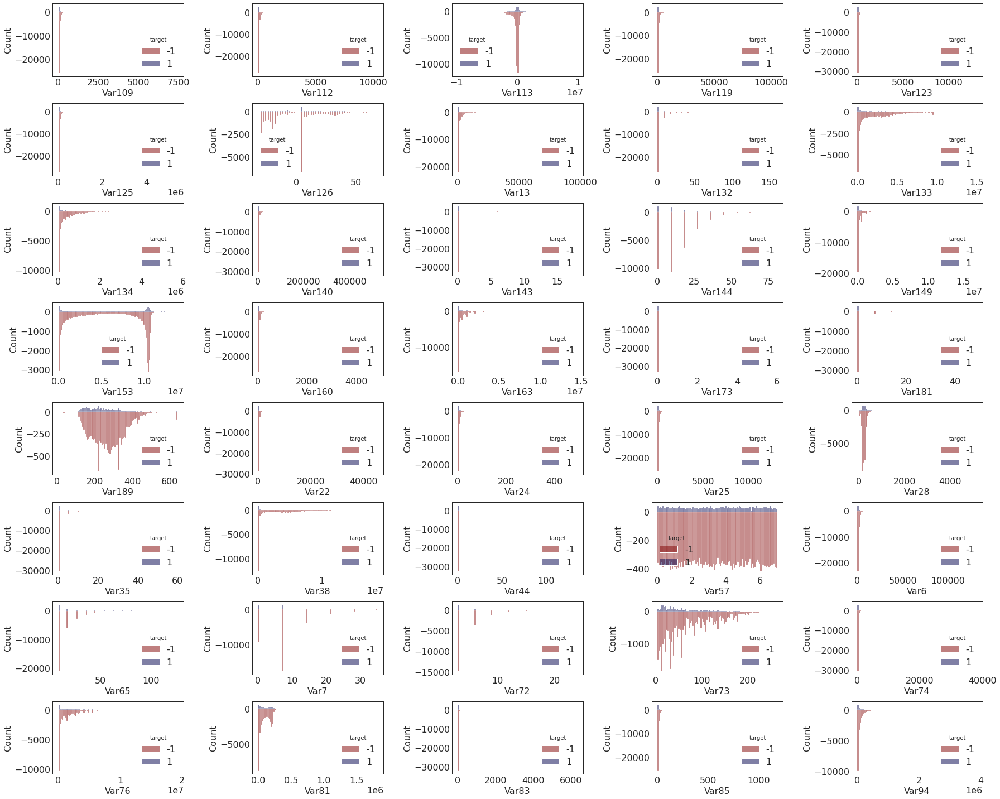

In [21]:
# построим гистограммы для числовых признаков
fig, axes = plt.subplots(nrows=8, ncols=5, figsize=(25, 20))

for idx, feature in enumerate(numerical):
    ax = axes[idx // 5, idx % 5];
    sns.histplot(data=train, x=feature, bins=100,
                 hue='target', palette="seismic_r", 
                 weights='target', ax=ax);
    ax.set_xlabel(feature);
    ax.set_ylabel('Count');

plt.tight_layout();

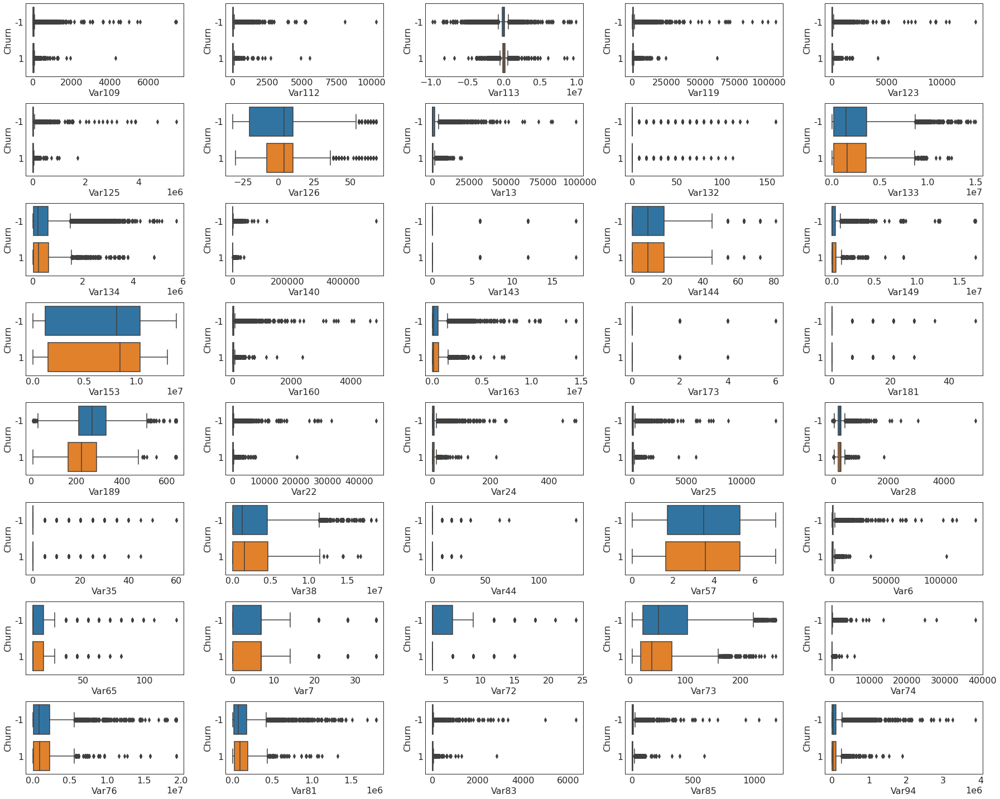

In [22]:
# далее построим боксплоты для числовых признаков в разрезе целевой переменной
fig, axes = plt.subplots(nrows=8, ncols=5, figsize=(25, 20))

for idx, feature in enumerate(numerical):
    ax=axes[idx // 5, idx % 5];
    sns.boxplot(x=feature, y='target', data=train, ax=ax, orient='h');
    ax.set_xlabel(feature);
    ax.set_ylabel('Churn');

plt.tight_layout();

Заметно, что для каждого из исследуемых выше признаков, существует порог, по которому можно явно отделить часть объектов класса -1. Визуально кажется, что объекты класса оттока (класс 1) явно отделить по данным признакам не получится.

Далее убедимся в том, что в распределения признаков сохраняются в данных для предсказания.

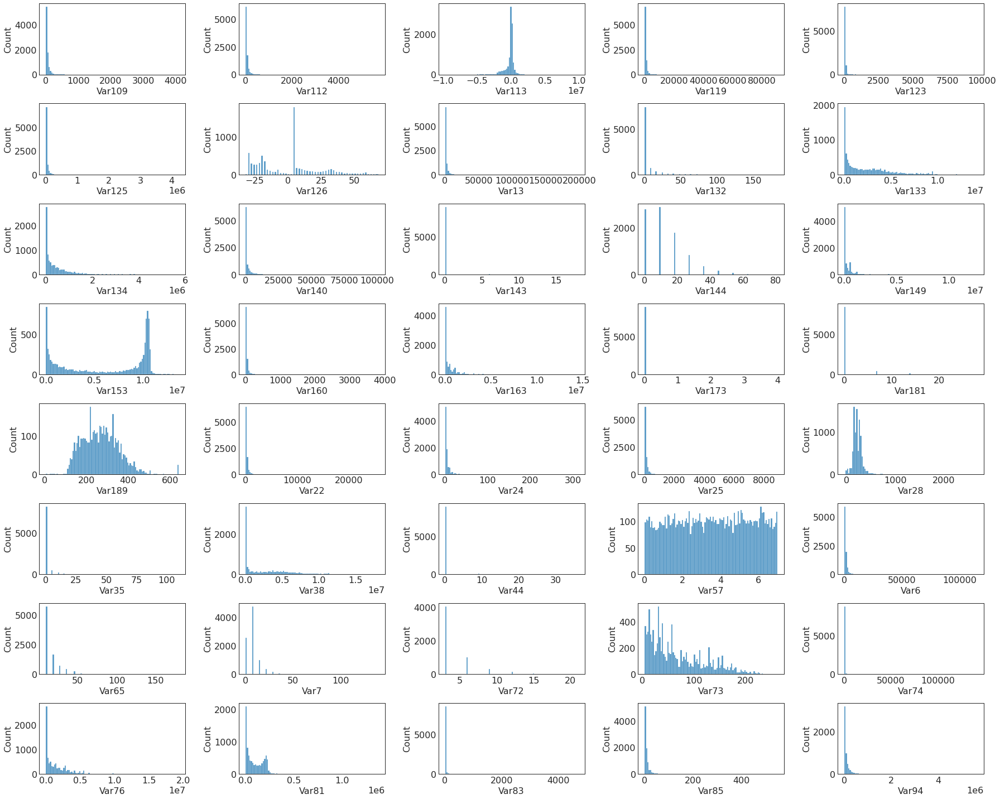

In [20]:
fig, axes = plt.subplots(nrows=8, ncols=5, figsize=(25, 20))

for idx, feature in enumerate(numerical):
    ax = axes[idx // 5, idx % 5];
    sns.histplot(data=test, x=feature, bins=100, palette="seismic_r", ax=ax);
    ax.set_xlabel(feature);
    ax.set_ylabel('Count');

plt.tight_layout();

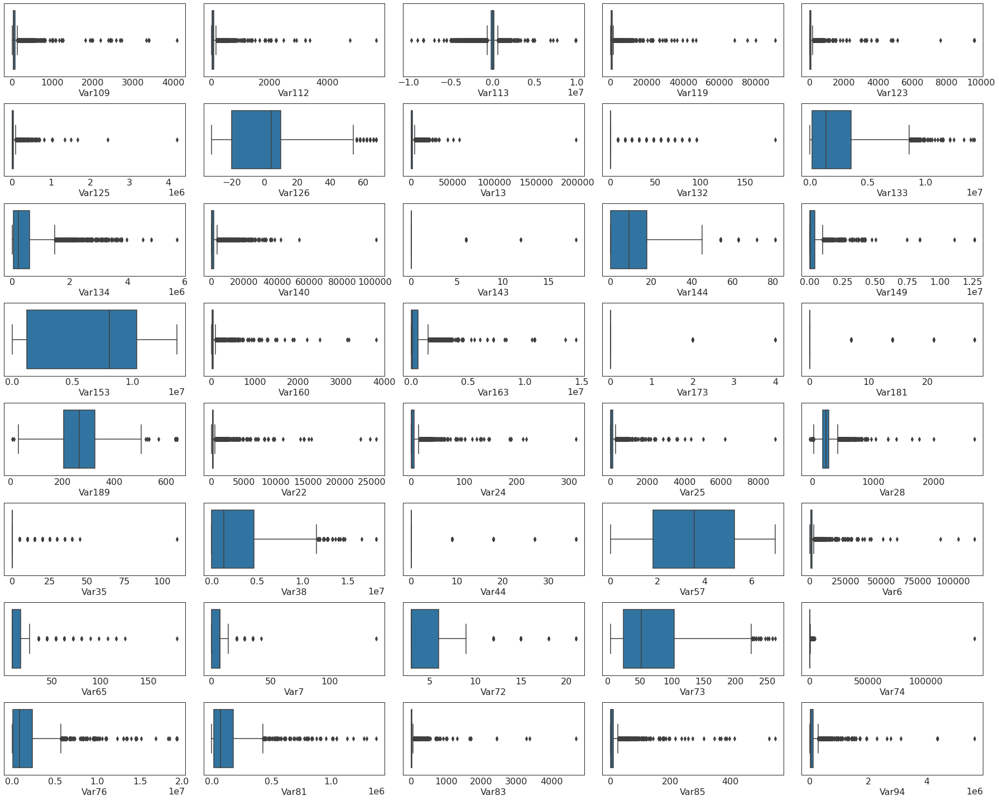

In [23]:
# далее построим боксплоты для числовых признаков в разрезе целевой переменной
fig, axes = plt.subplots(nrows=8, ncols=5, figsize=(25, 20))

for idx, feature in enumerate(numerical):
    ax=axes[idx // 5, idx % 5];
    sns.boxplot(x=feature, data=test, ax=ax, orient='h');
    ax.set_xlabel(feature);

plt.tight_layout();

Для большинства признаков характерно наличие тяжелых хвостов и выбросов. Т.к. данные анонимизированы, то трудно судить о природе распределений признаков, а также о причинах возникновения выбросов, что затрудняет их корректную обработку. В такой ситуации вероятнее всего модели, основанные на решающих деревьях, будут работать лучше, чем линейные.

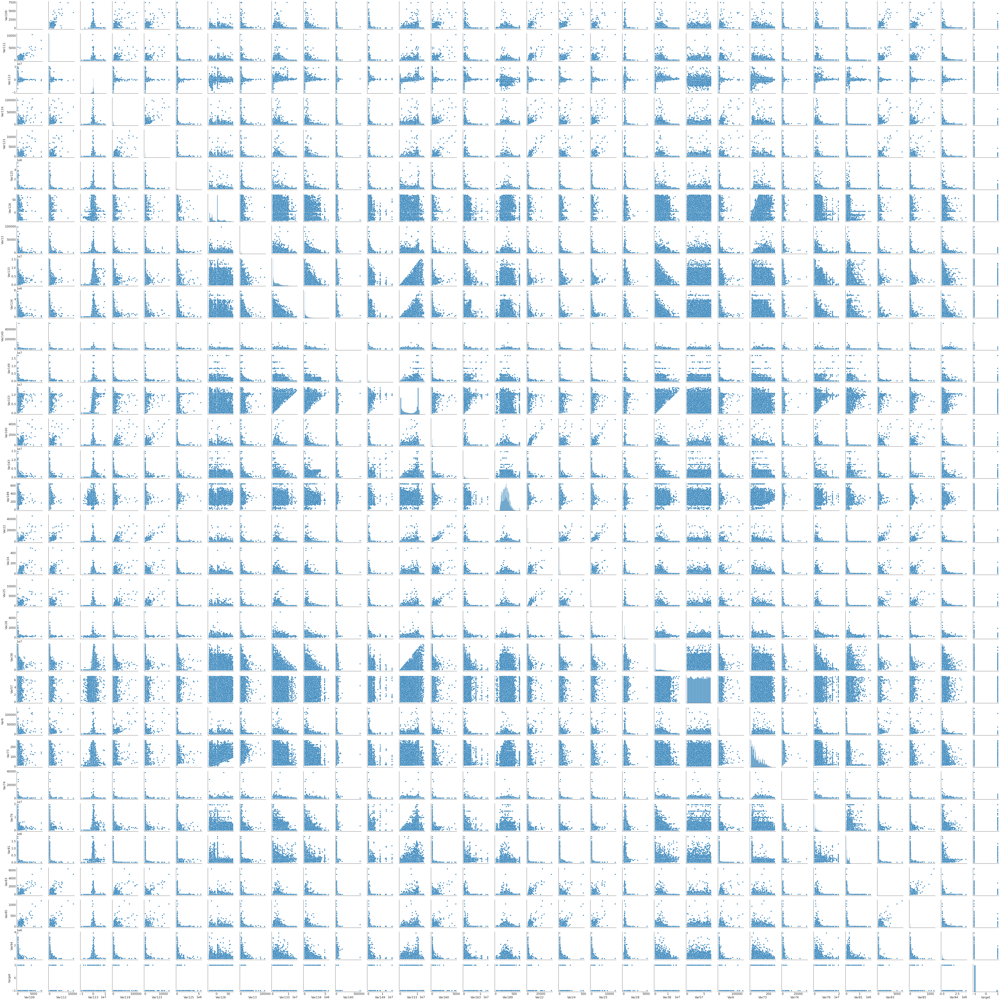

In [ ]:
# построим pairplot и попробуем разглядеть 
# интересные взаимосвязи между переменными
sns.pairplot(train[continuous + ['target']], palette="seismic_r");

Визуализируем некоторые интересные взаимосвязи.

In [11]:
pairs = (['Var73', 'Var126'], ['Var133', 'Var134'], 
         ['Var153', 'Var133'], ['Var133', 'Var163'], 
         ['Var133', 'Var38'], ['Var133', 'Var76'], 
         ['Var153', 'Var134'], ['Var134', 'Var163'], 
         ['Var134', 'Var38'], ['Var134', 'Var76'], 
         ['Var153', 'Var38'], ['Var153', 'Var76'], 
         ['Var163', 'Var38'], ['Var163', 'Var76'],
         ['Var38', 'Var76'], ['Var38', 'Var94'])

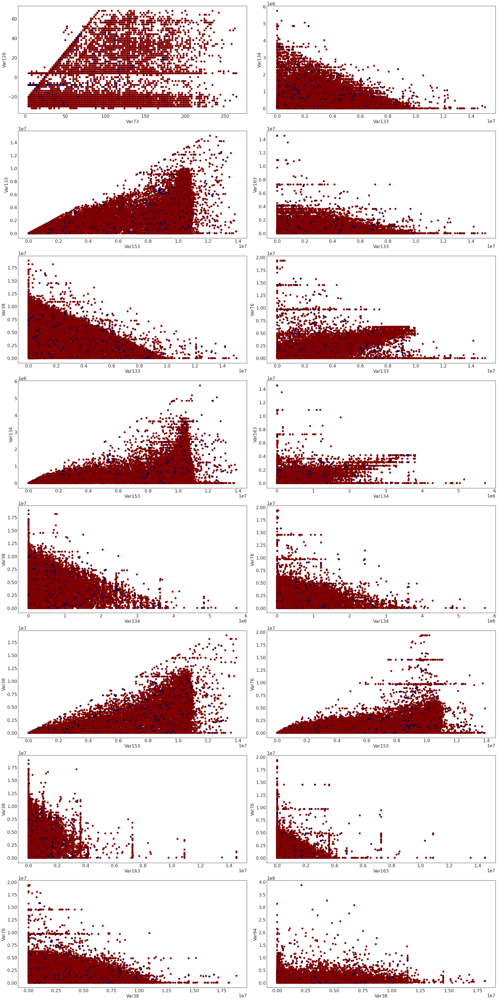

In [12]:
fig, axes = plt.subplots(nrows=8, ncols=2, figsize=(25, 50))

for idx, pair in enumerate(pairs):
    ax = axes[idx // 2, idx % 2];
    ax.scatter(train[pair[0]], train[pair[1]], 
               c=train.target, cmap="seismic_r");
    ax.set_xlabel(pair[0]);
    ax.set_ylabel(pair[1]);

plt.tight_layout();

На визуализациях для выделенных пар признаков, приведенных выше, видно, что точки на графиках располагаются ниже одной из диагоналей, задающихся уравнениями прямой kx + b. На основе данных взаимосвязей можно попробовать сгенерировать новые признаки вида X1 - X2, либо X1 / X2.

## Категориальные признаки

Посмотрим на количество различных градаций категориальных признаков

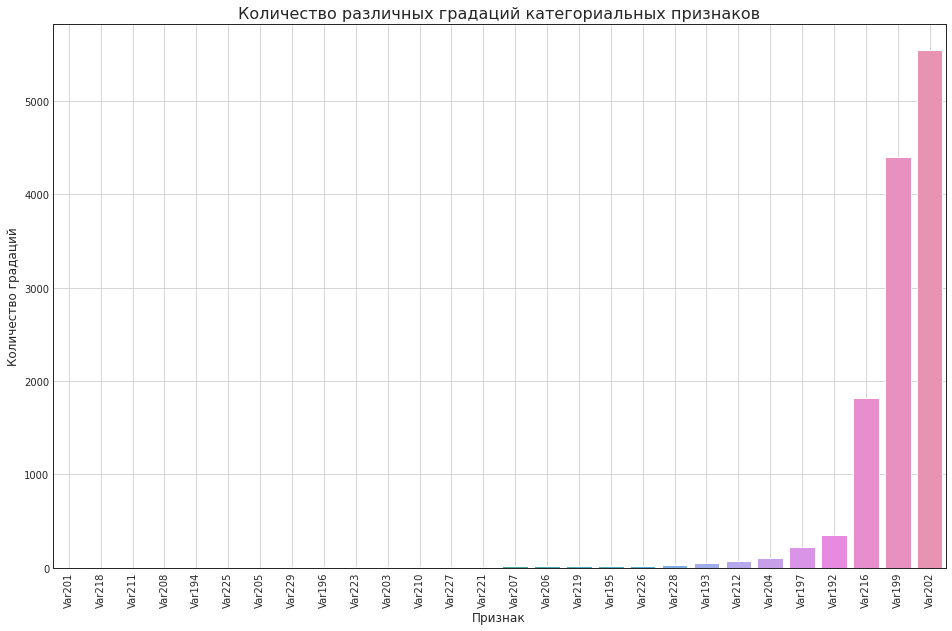

In [13]:
# создаем необходимые данные
cat_nuniques = (train[categorical].nunique().sort_values())

# отрисовываем график
plot_barplot(x=cat_nuniques.index, y=cat_nuniques,
             title='Количество различных градаций категориальных признаков',
             xlabel='Признак', ylabel='Количество градаций',
             xticks_size=10, xlabel_size=12, ylabel_size=12)

Часть категориальных переменных имеет большое количество уникальных градаций. Скорее всего часть этих градаций является редкими (содержаться в малом количество строк), поэтому необходимо будет провести их укрупнение при построении моделей. Порог укрупнения, как гиперпараметр, можно будет настроить на кросс-валидации.

## Пропуски

Посмотрим на то, как именно пропуски распределены внутри данных.

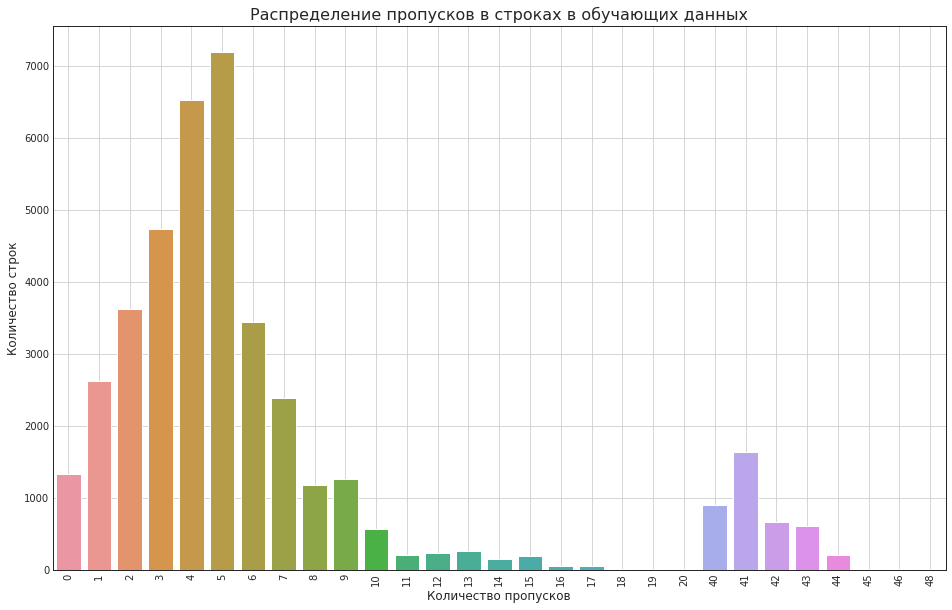

In [31]:
# посчитаем число пропусков в каждой строке и отрисуем 
# график распределения данного числа для данных обучения
nans_train_stats = count_row_nans(train).value_counts().sort_index()
plot_barplot(x=nans_train_stats.index, y=nans_train_stats,
             title='Распределение пропусков в строках в обучающих данных',
             xlabel='Количество пропусков', ylabel='Количество строк',
             xticks_size=10, xlabel_size=12, ylabel_size=12)

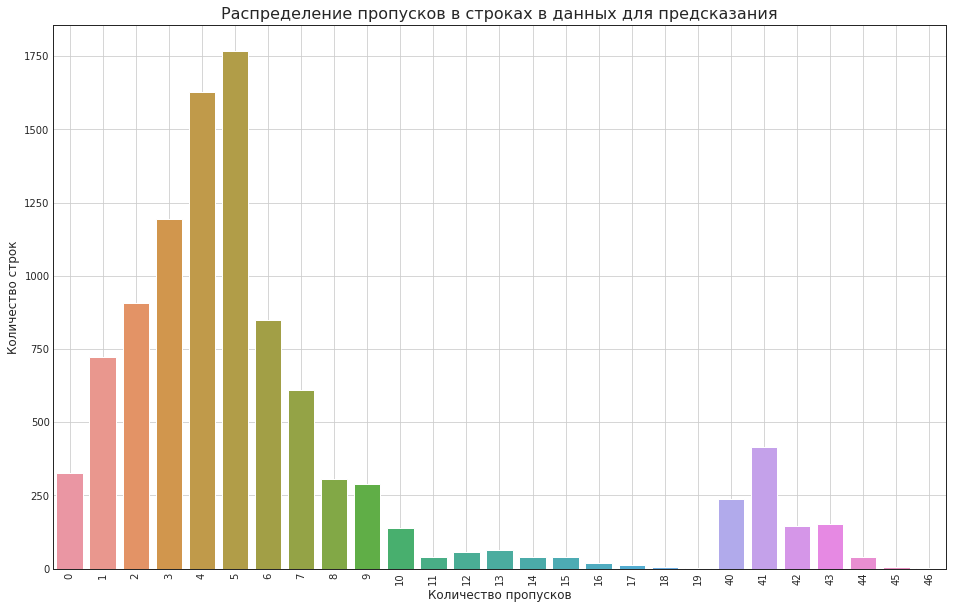

In [32]:
# то же самое сделаем для тестовых данных
nans_test_stats = count_row_nans(test).value_counts().sort_index()
plot_barplot(x=nans_test_stats.index, y=nans_test_stats,
             title='Распределение пропусков в строках в данных для предсказания',
             xlabel='Количество пропусков', ylabel='Количество строк',
             xticks_size=10, xlabel_size=12, ylabel_size=12)

Можно попробовать использовать количество пропусков в строке в качестве нового признака.

Далее исследуем распределение процента пропусков в признаках.

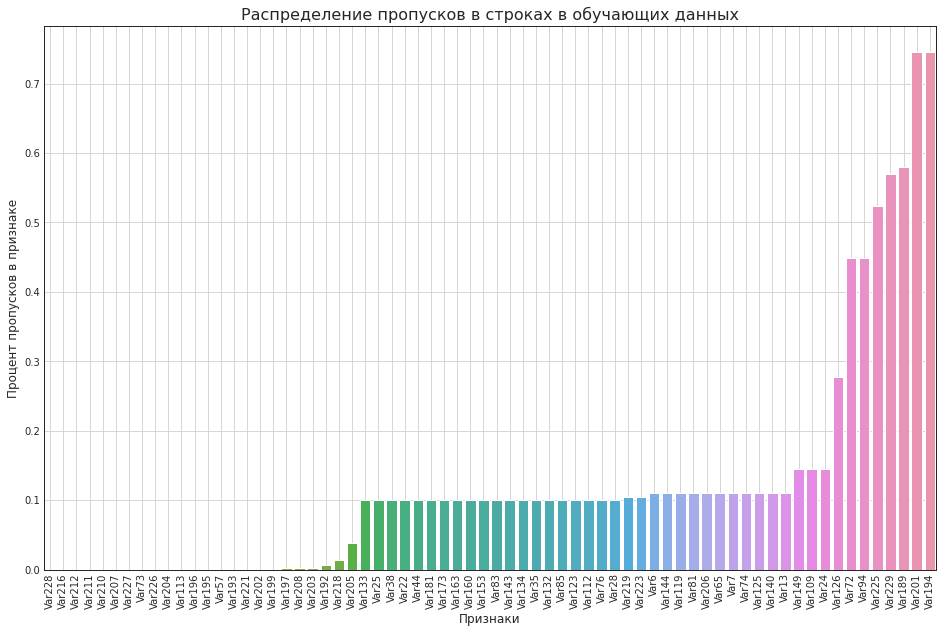

In [25]:
# создаем агрегированные данные
nans = train.drop('target', axis=1).isna().mean().sort_values(ascending=True)

# отрисовываем график
plot_barplot(x=nans.index, y=nans,
             title='Распределение пропусков в строках в обучающих данных',
             xlabel='Признаки', ylabel='Процент пропусков в признаке',
             xticks_size=10, xlabel_size=12, ylabel_size=12)

Из данной визуализации следует, что в данных существуют группы признаков, имеющих одинаковый процент пропусков. Визуализируем пропуски в строках данных, предварительно расположив признаки в порядке увеличения процента пропусков.

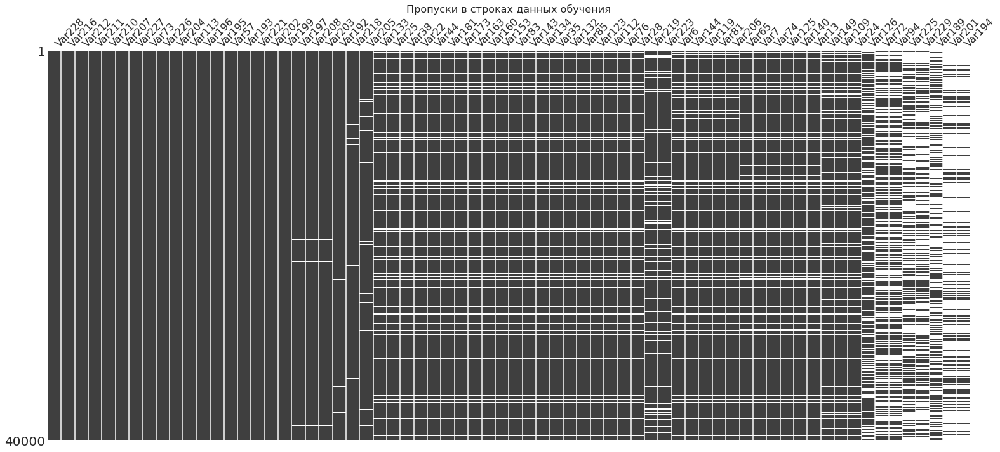

In [26]:
# для трейна
plot_missing_matrix(data=train[nans.index], labels=True,
                    title='Пропуски в строках данных обучения')

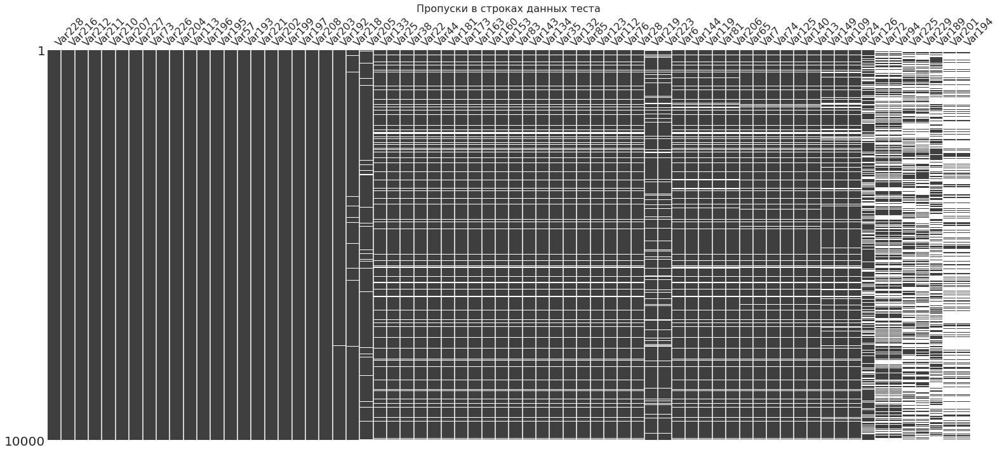

In [27]:
# для теста
plot_missing_matrix(data=test[nans.index], labels=True,
                    title='Пропуски в строках данных теста')

Отсортируем строки в данных по признакам из самой большой группы с одинаковым процентом пропусков и визуализируем пропуски снова.

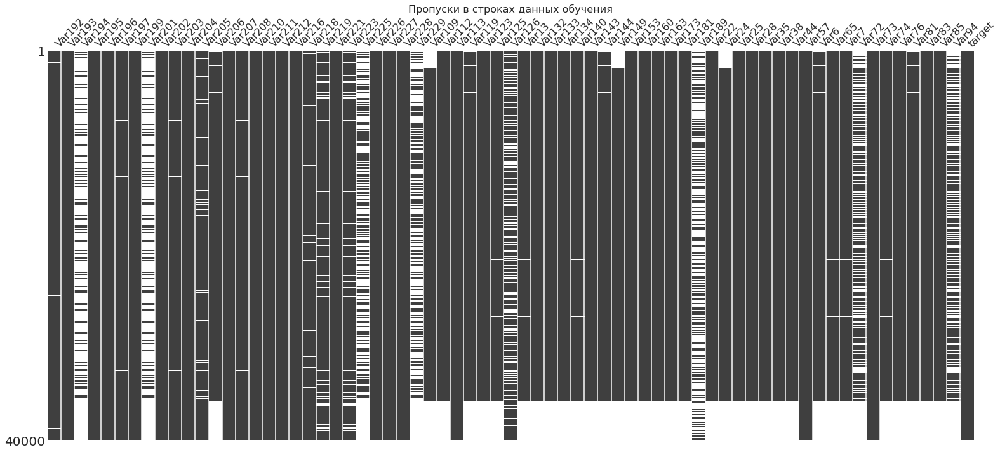

In [28]:
biggest_nans_group = nans[nans == 0.1004].index.to_list()

# для трэйна
plot_missing_matrix(data=train.sort_values(biggest_nans_group), labels=True,
                    title='Пропуски в строках данных обучения')

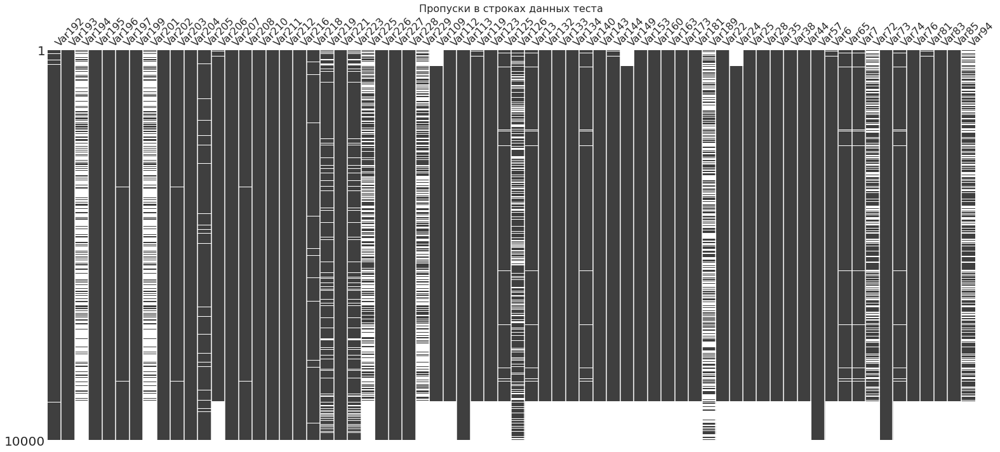

In [29]:
# для теста
plot_missing_matrix(data=test.sort_values(biggest_nans_group), labels=True,
                    title='Пропуски в строках данных теста')

Как в трейне, так и в тесте, ~10% строк имеют пропуски в определенном подмножестве признаков. Возможно данный факт является следствием сегментации пользователей: для определенного сегмента может не случайно отсутствовать часть признакового описания. Для проведения корректной валидации следует учитывать этот факт и проводить статификацию выборки не только по целевому признаку, но и по выделенным сегментам пользователей.